In [2]:
from datasets import load_dataset 
import numpy as np
import torch
ds = load_dataset("dhruvrnaik/pororo_storyviz", cache_dir="/content/hf_cache")


c:\Users\miral\Documents\StoryGAN\st\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
print(ds)

DatasetDict({
    train: Dataset({
        features: ['image', 'text', 'followings'],
        num_rows: 10191
    })
    validation: Dataset({
        features: ['image', 'text', 'followings'],
        num_rows: 2334
    })
    test: Dataset({
        features: ['image', 'text', 'followings'],
        num_rows: 2208
    })
})


In [4]:
id_to_index = {}
for idx, sample in enumerate(ds['train']):
    current_id = None
    if sample['followings']:
        first_following_id = sample['followings'][0]
        parts = first_following_id.split('_')
        if len(parts) > 1:
            try:
                last_part = int(parts[-1])
                base_id = '_'.join(parts[:-1])
                if idx == 0:
                    current_id = base_id + '_1'
                elif last_part > 1:
                    current_id = base_id + f'_{last_part - 1}'
                else:
                    pass
            except ValueError:
                pass
    if current_id:
        id_to_index[current_id] = idx

print(f"Mapped {len(id_to_index)} out of {len(ds['train'])} elements.")
print("Sample entries from id_to_index:")
for i, (id, index) in enumerate(id_to_index.items()):
    if i >= 5:
        break
    print(f"{id}: {index}")

Mapped 10191 out of 10191 elements.
Sample entries from id_to_index:
Pororo_ENGLISH1_1_Pororo_ENGLISH1_1_ep10_1: 0
Pororo_ENGLISH1_1_Pororo_ENGLISH1_1_ep10_10: 1
Pororo_ENGLISH1_1_Pororo_ENGLISH1_1_ep10_12: 2
Pororo_ENGLISH1_1_Pororo_ENGLISH1_1_ep10_13: 3
Pororo_ENGLISH1_1_Pororo_ENGLISH1_1_ep10_14: 4


In [5]:
stories = []
for idx, start_sample in enumerate(ds['train']):
    story = []
    current_sample = start_sample
    # Attempt to build a story of 5 elements
    for i in range(5):
        if current_sample:
            story.append(current_sample)
            if i < 4 and current_sample['followings']:
                next_id = current_sample['followings'][0]
                if next_id in id_to_index:
                    next_idx = id_to_index[next_id]
                    current_sample = ds['train'][next_idx]
                else:
                    current_sample = None # Cannot find the next element
            else:
                current_sample = None # End of followings or reached 5 elements
        else:
            break # Cannot continue the story sequence

    # Add the story if it contains 5 elements
    if len(story) == 5:
        stories.append(story)

# Print the number of stories created and the structure of the first story to verify.
print(f"Created {len(stories)} stories.")
if stories:
    print("\nStructure of the first story:")
    for i, element in enumerate(stories[0]):
        print(f"Element {i+1}:")
        print(f"  Keys: {element.keys()}")
        print(f"  Text: {element['text']}")
        print(f"  Image Type: {type(element['image'])}")
        print(f"  Followings: {element['followings']}")

Created 5040 stories.

Structure of the first story:
Element 1:
  Keys: dict_keys(['image', 'text', 'followings'])
  Text: Eddy is looking for something in Eddy's library.
  Image Type: <class 'PIL.PngImagePlugin.PngImageFile'>
  Followings: ['Pororo_ENGLISH1_1_Pororo_ENGLISH1_1_ep10_2', 'Pororo_ENGLISH1_1_Pororo_ENGLISH1_1_ep10_3', 'Pororo_ENGLISH1_1_Pororo_ENGLISH1_1_ep10_4', 'Pororo_ENGLISH1_1_Pororo_ENGLISH1_1_ep10_5']
Element 2:
  Keys: dict_keys(['image', 'text', 'followings'])
  Text: Eddy is standing on the ladder and Eddy is finding something on the bookshelf.
  Image Type: <class 'PIL.PngImagePlugin.PngImageFile'>
  Followings: ['Pororo_ENGLISH1_1_Pororo_ENGLISH1_1_ep10_3', 'Pororo_ENGLISH1_1_Pororo_ENGLISH1_1_ep10_4', 'Pororo_ENGLISH1_1_Pororo_ENGLISH1_1_ep10_5', 'Pororo_ENGLISH1_1_Pororo_ENGLISH1_1_ep10_6']
Element 3:
  Keys: dict_keys(['image', 'text', 'followings'])
  Text: Eddy found the book. Eddy climbs downs a ladder.
  Image Type: <class 'PIL.PngImagePlugin.PngImageF

In [6]:
story_structure_ok = True
for i, story in enumerate(stories):
    if len(story) != 5:
        print(f"Warning: Story {i} does not contain 5 elements. Length: {len(story)}")
        story_structure_ok = False
    for j, element in enumerate(story):
        if 'image' not in element or 'text' not in element:
            print(f"Warning: Element {j} in story {i} is missing 'image' or 'text' keys.")
            story_structure_ok = False

if story_structure_ok:
    print("All stories appear to have the correct structure (5 elements, with 'image' and 'text' keys).")
else:
    print("Some stories do not have the expected structure. Please review the grouping process.")

All stories appear to have the correct structure (5 elements, with 'image' and 'text' keys).


--- Story 1 ---
Sentence 1: Eddy is looking for something in Eddy's library.


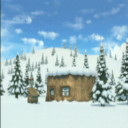

Sentence 2: Eddy is standing on the ladder and Eddy is finding something on the bookshelf.


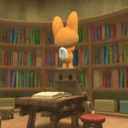

Sentence 3: Eddy found the book. Eddy climbs downs a ladder.


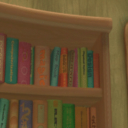

Sentence 4: Eddy looks at the book and questions himself.


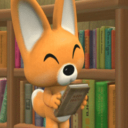

Sentence 5: Eddy came up with an idea and Eddy decides to make something.


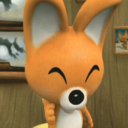



--- Story 2 ---
Sentence 1: Pororo and Crong look at the car and run toward the car.


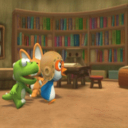

Sentence 2: Pororo and Crong stand in front of the car. They think the car is cool.


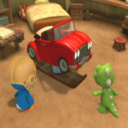

Sentence 3: Eddy comes over and says Eddy's plan.


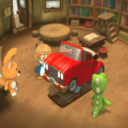

Sentence 4: Crong is looking around the car. Pororo asks a question.


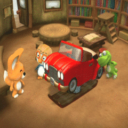

Sentence 5: Eddy stretches Eddy's arms. Eddy is taking the car to the playground for everyone.


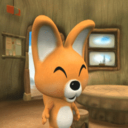



--- Story 3 ---
Sentence 1: Pororo and Crong stand in front of the car. They think the car is cool.


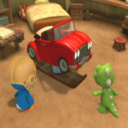

Sentence 2: Eddy comes over and says Eddy's plan.


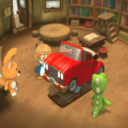

Sentence 3: Crong is looking around the car. Pororo asks a question.


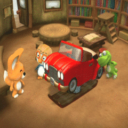

Sentence 4: Eddy stretches Eddy's arms. Eddy is taking the car to the playground for everyone.


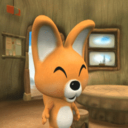

Sentence 5: Pororo agrees with Eddy and wants to help Eddy.


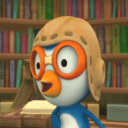



--- Story 4 ---
Sentence 1: Eddy comes over and says Eddy's plan.


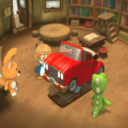

Sentence 2: Crong is looking around the car. Pororo asks a question.


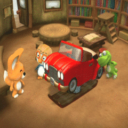

Sentence 3: Eddy stretches Eddy's arms. Eddy is taking the car to the playground for everyone.


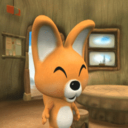

Sentence 4: Pororo agrees with Eddy and wants to help Eddy.


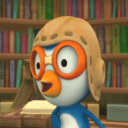

Sentence 5: Eddy is surprised. Pororo comes closer to the head of the car.


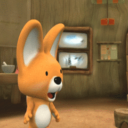

In [7]:
from IPython.display import display

# Display the first 4 stories
for i in range(min(4, len(stories))):
    print(f"--- Story {i+1} ---")
    story = stories[i]
    for j, element in enumerate(story):
        print(f"Sentence {j+1}: {element['text']}")
        display(element['image'])
    print("\n")

In [8]:
modified_stories = []
for story in stories:
    modified_story = []
    for element in story:
        text = element['text']
        if text.endswith('.'):
            modified_text = text[:-1].replace('.', ',') + '.'
        else:
            modified_text = text.replace('.', ',')

        modified_element = {
            'image': element['image'],
            'text': modified_text,
            'followings': element['followings'] # Keep followings as is
        }
        modified_story.append(modified_element)
    modified_stories.append(modified_story)

stories = modified_stories

print("Text of the first story after replacing full stops with commas:")
for i, element in enumerate(stories[3]):
    print(f"Element {i+1} Text: {element['text']}")

Text of the first story after replacing full stops with commas:
Element 1 Text: Eddy comes over and says Eddy's plan.
Element 2 Text: Crong is looking around the car, Pororo asks a question.
Element 3 Text: Eddy stretches Eddy's arms, Eddy is taking the car to the playground for everyone.
Element 4 Text: Pororo agrees with Eddy and wants to help Eddy.
Element 5 Text: Eddy is surprised, Pororo comes closer to the head of the car.


In [9]:
from sentence_transformers import SentenceTransformer

encoder = SentenceTransformer('sentence-transformers/paraphrase-MiniLM-L3-v2')
st_vector = encoder.encode(stories[0][0]['text'])
print(st_vector.shape)
print(f"Sentence embedding dimension: {st_vector.shape[0]}")

story_sentence_embeddings = []
for story in stories:
    story_embeddings = []
    for element in story:
        embedding = encoder.encode(element['text'])
        story_embeddings.append(embedding)
    story_sentence_embeddings.append(story_embeddings)

print(f"Created embeddings for {len(story_sentence_embeddings)} stories")
print(f"Each story has {len(story_sentence_embeddings[0])} sentence embeddings")
print(f"Each sentence embedding has shape: {story_sentence_embeddings[0][0].shape}")

(384,)
Sentence embedding dimension: 384
Created embeddings for 5040 stories
Each story has 5 sentence embeddings
Each sentence embedding has shape: (384,)


In [10]:
import numpy as np
story_embeddings = []
for story in stories:
    senc_vector = np.concatenate([encoder.encode(element['text']) for element in story])
    story_embeddings.append(senc_vector)


In [11]:
story_embeddings_tensor = [torch.from_numpy(st_vector) for st_vector in story_embeddings]
all_story_embeddings_tensor = torch.stack(story_embeddings_tensor)

In [12]:
import torch
from torch import nn
from torch.nn import functional as F
z_dim = 128

class MLPs(nn.Module):
  def __init__(self, input_dim, latent_dim):
    super().__init__()
    self.mlp_mu = nn.Sequential(
        nn.Linear(input_dim, 256),
        nn.ReLU(),
        nn.Linear(256, latent_dim)
    )
    self.mlp_logvar = nn.Sequential(
        nn.Linear(input_dim, 256),
        nn.ReLU(),
        nn.Linear(256, latent_dim)
    )

  def forward(self, S_enc):
    mu = self.mlp_mu(S_enc)
    logvar = self.mlp_logvar(S_enc)
    return mu, logvar

input_dim = story_embeddings[0].shape[0]
model = MLPs(input_dim, z_dim)

mu, logvar = model(all_story_embeddings_tensor)
std = torch.exp(0.5 * logvar)
eps = torch.randn_like(std)
h0_tensor = mu + eps * std

print(f"Shape of the h0 tensor for all stories: {h0_tensor.shape}")


Shape of the h0 tensor for all stories: torch.Size([5040, 128])


In [ ]:
def kl_divergence_loss(mu, logvar):
  kl_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp(), dim = 1)
  return kl_loss.mean()

In [13]:
import torch
from torch import nn
import torch.nn.functional as F 

class Text2GistCell(nn.Module):
  
    
  def __init__(self,input_dim, hidden_dim):
    super().__init__()
    self.z = nn.Linear(input_dim+hidden_dim, hidden_dim)
    self.r = nn.Linear(input_dim+hidden_dim,hidden_dim)
    self.h = nn.Linear(input_dim+hidden_dim, hidden_dim)
    self.filter = nn.Sequential(
        nn.Linear(input_dim+hidden_dim, hidden_dim),
        nn.Tanh(),
        nn.Unflatten(1,(hidden_dim,1))
    )

  def forward(self, i_t, h_prev):
    combined = torch.cat((i_t, h_prev), dim=-1)
    z_t = torch.sigmoid(self.z(combined))
    r_t = torch.sigmoid(self.r(combined))
    h_tilde_t = torch.tanh(self.h(torch.cat((i_t, r_t * h_prev), dim=-1)))
    h_t = (1 - z_t) * h_prev + z_t * h_tilde_t
    filt = self.filter(torch.cat((i_t, h_prev), dim=-1)) 
    h_conv = h_t.unsqueeze(-1)
    o_t = torch.sum(filt*h_conv, dim=2) 
    o_t = o_t.squeeze(-1) 

    return o_t, h_t

st_dim = 384 
noise_dim = 100
it_dim = 512 
ht_dim = 128
T = 5
first_gru_layer = nn.GRUCell(input_size=st_dim + noise_dim, hidden_size=it_dim)

class TwoLayerRNN(nn.Module):
    def __init__(self, st_dim, noise_dim, it_dim, ht_dim, T):
        super().__init__()
        self.st_dim = st_dim
        self.noise_dim = noise_dim
        self.it_dim = it_dim
        self.ht_dim = ht_dim
        self.T = T

        self.gru1 = nn.GRUCell(input_size=st_dim + noise_dim, hidden_size=it_dim)

        self.text2gist = Text2GistCell(input_dim=it_dim, hidden_dim=ht_dim)

    def forward(self, sentence_embeddings_sequence, noise_sequence, g0, h0):
        batch_size = sentence_embeddings_sequence.size(0)

        it_sequence = []
        ot_sequence = []
        g_sequence = [] 
        h_sequence = [] 

        g_t_minus_1 = g0
        h_t_minus_1 = h0

        for t in range(self.T):
           st_t = sentence_embeddings_sequence[:,t,:]
           noise_t = noise_sequence[:,t,:]
           gru1_input_t = torch.cat((st_t, noise_t),dim=-1)
           i

        for t in range(self.T):
            st_t = sentence_embeddings_sequence[:, t, :] 
            noise_t = noise_sequence[:, t, :] 
            gru1_input_t = torch.cat((st_t, noise_t), dim=-1) 
            g_t = self.gru1(gru1_input_t, g_t_minus_1) 
            it_t = g_t 

            ot_t, h_t = self.text2gist(it_t, h_t_minus_1)
            it_sequence.append(it_t)
            ot_sequence.append(ot_t)
            g_sequence.append(g_t)
            h_sequence.append(h_t)
            g_t_minus_1 = g_t
            h_t_minus_1 = h_t

        it_sequence = torch.stack(it_sequence, dim=1) 
        ot_sequence = torch.stack(ot_sequence, dim=1) 
        g_sequence = torch.stack(g_sequence, dim=1) 
        h_sequence = torch.stack(h_sequence, dim=1)
        return it_sequence, ot_sequence, g_sequence, h_sequence

In [14]:
class ImageGenerator(nn.Module):
    def __init__(self, gist_dim, img_channels=3, img_size=128):
        super().__init__()
        self.init_size = img_size // 16
        self.fc = nn.Sequential(
            nn.Linear(gist_dim, 512 * self.init_size * self.init_size),
            nn.BatchNorm1d(512 * self.init_size * self.init_size),
            nn.ReLU()
        )

        self.upsample = nn.Sequential(
            nn.BatchNorm2d(512),
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.Conv2d(512, 256, 3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),

            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.Conv2d(256, 128, 3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),

            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.Conv2d(128, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),

            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.Conv2d(64, img_channels, 3, padding=1),
            nn.Tanh()
        )

    def forward(self, o_t):
        out = self.fc(o_t)
        out = out.view(out.size(0), 512, self.init_size, self.init_size)
        img = self.upsample(out)
        return img
    def forward(self, o_t):
        out = self.fc(o_t)                        
        out = out.view(out.size(0), 512, self.init_size, self.init_size)
        img = self.upsample(out)
        return img  


In [15]:
class ImageDiscriminator(nn.Module):
    def __init__(self, img_size=128, sentence_dim=128, h0_dim=128):
        super().__init__()
        self.img_encoder = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1),  # downsample
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, 4, 2, 1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 256, 4, 2, 1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
            nn.Flatten(), 
        )

        img_feature_dim = (img_size // 8) ** 2 * 256 

        self.classifier = nn.Sequential(
            nn.Linear(img_feature_dim + sentence_dim + h0_dim, 512),
            nn.LeakyReLU(0.2),
            nn.Linear(512, 1),
            nn.Sigmoid()
        )

    def forward(self, img, s_t, h0):
        img_feat = self.img_encoder(img)
        combined = torch.cat([img_feat, s_t, h0], dim=1)
        validity = self.classifier(combined)
        return validity


In [16]:
class StoryDiscriminator(nn.Module):
    def __init__(self, T, sentence_dim=384, img_feature_dim=128):
        super().__init__()
        self.T = T
        self.img_encoder = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, 4, 2, 1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.AdaptiveAvgPool2d((1, 1)),
            nn.Flatten(),  # → (B, img_feature_dim)
        )

        # Project sentence embeddings to match image feature dimension
        self.sentence_projection = nn.Linear(sentence_dim, img_feature_dim)

        self.classifier = nn.Sequential(
            nn.Linear(T * img_feature_dim, 512),
            nn.ReLU(),
            nn.Linear(512, 1),
            nn.Sigmoid()
        )

    def forward(self, imgs, s_vecs):
        img_feats = [self.img_encoder(img) for img in imgs]
        text_feats = [self.sentence_projection(s_vec) for s_vec in s_vecs]  

        elementwise = [i_feat * s_feat for i_feat, s_feat in zip(img_feats, text_feats)]
        concat = torch.cat(elementwise, dim=1)                      
        out = self.classifier(concat)                              
        return out


In [17]:
import torch
import torch.nn as nn
import torch.optim as optim

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
alpha = 0.5  
beta = 1.0 
st_dim = 384 
noise_dim = 100 
it_dim = 512 
ht_dim = 128
z_dim = 128  
T = 5 
img_size = 128

# Initialize models
context_encoder = MLPs(input_dim=st_dim * T, latent_dim=z_dim).to(device)
text2gist_rnn = TwoLayerRNN(st_dim=st_dim, noise_dim=noise_dim, it_dim=it_dim, ht_dim=ht_dim, T=T).to(device)
image_generator = ImageGenerator(gist_dim=ht_dim, img_channels=3, img_size=img_size).to(device)
image_discriminator = ImageDiscriminator(img_size=img_size, sentence_dim=st_dim, h0_dim=z_dim).to(device)
story_discriminator = StoryDiscriminator(T=T, sentence_dim=st_dim, img_feature_dim=128).to(device)

# Optimizers
gen_params = list(image_generator.parameters()) + list(text2gist_rnn.parameters()) + list(context_encoder.parameters())
optimizer_G = optim.Adam(gen_params, lr=2e-4, betas=(0.5, 0.999))
optimizer_DI = optim.Adam(image_discriminator.parameters(), lr=1e-5, betas=(0.5, 0.999))
optimizer_DS = optim.Adam(story_discriminator.parameters(), lr=1e-4, betas=(0.5, 0.999))

# Loss function
adversarial_loss = nn.BCELoss()

def train_step_fixed(sentence_embeddings_sequence, real_images):
    batch_size = sentence_embeddings_sequence.size(0)
    real_labels = torch.ones_like(torch.randn(batch_size, 1)).to(device) * 0.9
    fake_labels = torch.ones_like(torch.randn(batch_size, 1)).to(device) * 0.1
    S_enc = sentence_embeddings_sequence.view(batch_size, -1)
    d_image_loss = torch.tensor(0.0)
    if torch.rand(1).item() < 0.2: 
        optimizer_DI.zero_grad()
        mu, logvar = context_encoder(S_enc)
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        h0 = mu + eps * std
        
        noise_sequence = torch.randn(batch_size, T, noise_dim).to(device)
        g0 = torch.zeros(batch_size, it_dim).to(device)
        h0_rnn = torch.zeros(batch_size, ht_dim).to(device)
        
        it_sequence, ot_sequence, _, _ = text2gist_rnn(sentence_embeddings_sequence, noise_sequence, g0, h0_rnn)
        
        fake_images = []
        for t in range(T):
            o_t = ot_sequence[:, t, :]
            fake_img = image_generator(o_t)
            fake_images.append(fake_img)

        sentence_embeddings_list = [sentence_embeddings_sequence[:, t, :] for t in range(T)]
        
        real_preds = []
        fake_preds = []
        for t in range(T):
            real_pred = image_discriminator(real_images[t], sentence_embeddings_list[t], h0.detach())
            fake_pred = image_discriminator(fake_images[t].detach(), sentence_embeddings_list[t], h0.detach())
            real_preds.append(real_pred)
            fake_preds.append(fake_pred)

        real_loss = sum([adversarial_loss(pred, real_labels.expand_as(pred)) for pred in real_preds]) / T
        fake_loss = sum([adversarial_loss(pred, fake_labels.expand_as(pred)) for pred in fake_preds]) / T
        d_image_loss = real_loss + fake_loss
        
        torch.nn.utils.clip_grad_norm_(image_discriminator.parameters(), max_norm=1.0)
        d_image_loss.backward()
        optimizer_DI.step()
    optimizer_DS.zero_grad()
    mu, logvar = context_encoder(S_enc)
    std = torch.exp(0.5 * logvar)
    eps = torch.randn_like(std)
    h0 = mu + eps * std
    
    noise_sequence = torch.randn(batch_size, T, noise_dim).to(device)
    g0 = torch.zeros(batch_size, it_dim).to(device)
    h0_rnn = torch.zeros(batch_size, ht_dim).to(device)
    
    it_sequence, ot_sequence, _, _ = text2gist_rnn(sentence_embeddings_sequence, noise_sequence, g0, h0_rnn)
    
    fake_images = []
    for t in range(T):
        o_t = ot_sequence[:, t, :]
        fake_img = image_generator(o_t)
        fake_images.append(fake_img)

    sentence_embeddings_list = [sentence_embeddings_sequence[:, t, :] for t in range(T)]
    
    ds_real = story_discriminator(real_images, sentence_embeddings_list)
    ds_fake = story_discriminator([img.detach() for img in fake_images], sentence_embeddings_list)

    d_story_loss = adversarial_loss(ds_real, real_labels.expand_as(ds_real)) + \
                   adversarial_loss(ds_fake, fake_labels.expand_as(ds_fake))
    d_story_loss.backward()
    optimizer_DS.step()
    g_image_loss_total = 0.0
    g_story_loss_total = 0.0
    kl_total = 0.0
    
    for gen_step in range(2):
        optimizer_G.zero_grad()
        mu, logvar = context_encoder(S_enc)
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        h0 = mu + eps * std
        
        noise_sequence = torch.randn(batch_size, T, noise_dim).to(device)
        g0 = torch.zeros(batch_size, it_dim).to(device)
        h0_rnn = torch.zeros(batch_size, ht_dim).to(device)
        
        it_sequence_gen, ot_sequence_gen, _, _ = text2gist_rnn(sentence_embeddings_sequence, noise_sequence, g0, h0_rnn)
        
        fake_images_gen = []
        for t in range(T):
            o_t = ot_sequence_gen[:, t, :]
            fake_img = image_generator(o_t)
            fake_images_gen.append(fake_img)
        
        # Generator losses
        fake_preds_gen = []
        for t in range(T):
            fake_pred = image_discriminator(fake_images_gen[t], sentence_embeddings_list[t], h0)
            fake_preds_gen.append(fake_pred)
        
        ds_fake_gen = story_discriminator(fake_images_gen, sentence_embeddings_list)

        g_image_loss = sum([adversarial_loss(pred, real_labels.expand_as(pred)) for pred in fake_preds_gen]) / T
        g_story_loss = adversarial_loss(ds_fake_gen, real_labels.expand_as(ds_fake_gen))
        kl = kl_divergence_loss(mu, logvar)
        total_loss = 0.1 * g_image_loss + beta * g_story_loss + kl
        g_image_loss_total += g_image_loss.item()
        g_story_loss_total += g_story_loss.item()
        kl_total += kl.item()
        if total_loss > 10.0:
            total_loss = torch.clamp(total_loss, max=10.0)
        total_loss.backward()
        torch.nn.utils.clip_grad_norm_(gen_params, max_norm=1.0)
        optimizer_G.step()

    return {
        'D_image_loss': d_image_loss.item() if isinstance(d_image_loss, torch.Tensor) else 0.0,
        'D_story_loss': d_story_loss.item(),
        'G_image_loss': g_image_loss_total / 2, 
        'G_story_loss': g_story_loss_total / 2,
        'G_total_loss': (g_image_loss_total + g_story_loss_total + kl_total) / 2,
        'KL_loss': kl_total / 2
    }

In [18]:
import torch
import torch.nn as nn
import torch.optim as optim

optimizer_DI = optim.Adam(image_discriminator.parameters(), lr=1e-6, betas=(0.5, 0.999))  
optimizer_G = optim.Adam(gen_params, lr=2e-4, betas=(0.5, 0.999)) 
optimizer_DS = optim.Adam(story_discriminator.parameters(), lr=1e-4, betas=(0.5, 0.999))

def train_step(sentence_embeddings_sequence, real_images):
    batch_size = sentence_embeddings_sequence.size(0)
    
    real_labels = torch.ones_like(torch.randn(batch_size, 1)).to(device) * 0.95  
    fake_labels = torch.ones_like(torch.randn(batch_size, 1)).to(device) * 0.05  
    
    S_enc = sentence_embeddings_sequence.view(batch_size, -1)
    sentence_embeddings_list = [sentence_embeddings_sequence[:, t, :] for t in range(T)]
 
    d_image_loss = torch.tensor(0.0)
    if torch.rand(1).item() < 0.5:  
        optimizer_DI.zero_grad()
        
        mu_disc, logvar_disc = context_encoder(S_enc)
        std_disc = torch.exp(0.5 * logvar_disc)
        eps_disc = torch.randn_like(std_disc)
        h0_disc = mu_disc + eps_disc * std_disc
        
        noise_sequence_disc = torch.randn(batch_size, T, noise_dim).to(device)
        g0_disc = torch.zeros(batch_size, it_dim).to(device)
        h0_rnn_disc = torch.zeros(batch_size, ht_dim).to(device)
        
        it_sequence_disc, ot_sequence_disc, _, _ = text2gist_rnn(sentence_embeddings_sequence, noise_sequence_disc, g0_disc, h0_rnn_disc)
        
        fake_images_disc = []
        for t in range(T):
            o_t = ot_sequence_disc[:, t, :]
            fake_img = image_generator(o_t)
            fake_images_disc.append(fake_img)

        real_losses = []
        fake_losses = []
        for t in range(T):
            real_pred = image_discriminator(real_images[t], sentence_embeddings_list[t], h0_disc.detach())
            fake_pred = image_discriminator(fake_images_disc[t].detach(), sentence_embeddings_list[t], h0_disc.detach())
            
            real_losses.append(adversarial_loss(real_pred, real_labels.expand_as(real_pred)))
            fake_losses.append(adversarial_loss(fake_pred, fake_labels.expand_as(fake_pred)))
        
        real_loss = sum(real_losses) / T
        fake_loss = sum(fake_losses) / T
        d_image_loss = real_loss + fake_loss  
        
        d_image_loss.backward()
        torch.nn.utils.clip_grad_norm_(image_discriminator.parameters(), max_norm=5.0)  
        optimizer_DI.step()

    optimizer_DS.zero_grad()
    
    mu_story, logvar_story = context_encoder(S_enc)
    std_story = torch.exp(0.5 * logvar_story)
    eps_story = torch.randn_like(std_story)
    h0_story = mu_story + eps_story * std_story
    
    noise_sequence_story = torch.randn(batch_size, T, noise_dim).to(device)
    g0_story = torch.zeros(batch_size, it_dim).to(device)
    h0_rnn_story = torch.zeros(batch_size, ht_dim).to(device)
    
    it_sequence_story, ot_sequence_story, _, _ = text2gist_rnn(sentence_embeddings_sequence, noise_sequence_story, g0_story, h0_rnn_story)
    
    fake_images_story = []
    for t in range(T):
        o_t = ot_sequence_story[:, t, :]
        fake_img = image_generator(o_t)
        fake_images_story.append(fake_img)
    
    ds_real = story_discriminator(real_images, sentence_embeddings_list)
    ds_fake = story_discriminator([img.detach() for img in fake_images_story], sentence_embeddings_list)

    d_story_loss = adversarial_loss(ds_real, real_labels.expand_as(ds_real)) + \
                   adversarial_loss(ds_fake, fake_labels.expand_as(ds_fake))
    d_story_loss.backward()
    torch.nn.utils.clip_grad_norm_(story_discriminator.parameters(), max_norm=5.0)
    optimizer_DS.step()

    #Train Generator 
    g_image_loss_total = 0.0
    g_story_loss_total = 0.0
    kl_total = 0.0
    
    for gen_iter in range(2):
        optimizer_G.zero_grad()
        
        mu, logvar = context_encoder(S_enc)
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        h0 = mu + eps * std
        
        noise_sequence = torch.randn(batch_size, T, noise_dim).to(device)
        g0 = torch.zeros(batch_size, it_dim).to(device)
        h0_rnn = torch.zeros(batch_size, ht_dim).to(device)
        
        it_sequence_gen, ot_sequence_gen, _, _ = text2gist_rnn(sentence_embeddings_sequence, noise_sequence, g0, h0_rnn)
        
        fake_images_gen = []
        for t in range(T):
            o_t = ot_sequence_gen[:, t, :]
            fake_img = image_generator(o_t)
            fake_images_gen.append(fake_img)
        
        fake_preds_gen = []
        for t in range(T):
            fake_pred = image_discriminator(fake_images_gen[t], sentence_embeddings_list[t], h0)
            fake_preds_gen.append(fake_pred)
        
        ds_fake_gen = story_discriminator(fake_images_gen, sentence_embeddings_list)

        g_image_loss = sum([adversarial_loss(pred, real_labels.expand_as(pred)) for pred in fake_preds_gen]) / T
        g_story_loss = adversarial_loss(ds_fake_gen, real_labels.expand_as(ds_fake_gen))
        kl = kl_divergence_loss(mu, logvar)

        total_loss = 1.0 * g_image_loss + 1.0 * g_story_loss + 0.1 * kl  
        
        g_image_loss_total += g_image_loss.item()
        g_story_loss_total += g_story_loss.item()
        kl_total += kl.item()
        
        total_loss.backward()
        torch.nn.utils.clip_grad_norm_(gen_params, max_norm=5.0)  
        optimizer_G.step()

    return {
        'D_image_loss': d_image_loss.item() if isinstance(d_image_loss, torch.Tensor) else 0.0,
        'D_story_loss': d_story_loss.item(),
        'G_image_loss': g_image_loss_total / 2,
        'G_story_loss': g_story_loss_total / 2,
        'G_total_loss': (g_image_loss_total + g_story_loss_total + kl_total) / 2,
        'KL_loss': kl_total / 2
    }

In [ ]:
del context_encoder, text2gist_rnn, image_generator, image_discriminator, story_discriminator
del optimizer_G, optimizer_DI, optimizer_DS
context_encoder = MLPs(input_dim=st_dim * T, latent_dim=z_dim).to(device)
text2gist_rnn = TwoLayerRNN(st_dim=st_dim, noise_dim=noise_dim, it_dim=it_dim, ht_dim=ht_dim, T=T).to(device)
image_generator = ImageGenerator(gist_dim=ht_dim, img_channels=3, img_size=img_size).to(device)
image_discriminator = ImageDiscriminator(img_size=img_size, sentence_dim=st_dim, h0_dim=z_dim).to(device)
story_discriminator = StoryDiscriminator(T=T, sentence_dim=st_dim, img_feature_dim=128).to(device)
gen_params = list(image_generator.parameters()) + list(text2gist_rnn.parameters()) + list(context_encoder.parameters())
optimizer_G = optim.Adam(gen_params, lr=2e-4, betas=(0.5, 0.999))
optimizer_DI = optim.Adam(image_discriminator.parameters(), lr=2e-4, betas=(0.5, 0.999))
optimizer_DS = optim.Adam(story_discriminator.parameters(), lr=1e-4, betas=(0.5, 0.999))

print("Models reinitialized successfully!")
print(f"Using device: {device}")

print("\nTesting Text2GistCell output shape:")
test_batch_size = 4
test_input = torch.randn(test_batch_size, it_dim).to(device)
test_hidden = torch.randn(test_batch_size, ht_dim).to(device)
test_cell = text2gist_rnn.text2gist

with torch.no_grad():
    test_output, test_new_hidden = test_cell(test_input, test_hidden)
    print(f"Input shape: {test_input.shape}")
    print(f"Hidden shape: {test_hidden.shape}")
    print(f"Output shape: {test_output.shape}")
    print(f"New hidden shape: {test_new_hidden.shape}")
    
    # Test if this works with ImageGenerator
    test_generated_img = image_generator(test_output)
    print(f"Generated image shape: {test_generated_img.shape}")

print("\nAll models are ready for training!")

Reinitializing models with corrected Text2GistCell...
Models reinitialized successfully!
Using device: cuda

Testing Text2GistCell output shape:
Input shape: torch.Size([4, 512])
Hidden shape: torch.Size([4, 128])
Output shape: torch.Size([4, 128])
New hidden shape: torch.Size([4, 128])
Generated image shape: torch.Size([4, 3, 128, 128])

All models are ready for training!
Models reinitialized successfully!
Using device: cuda

Testing Text2GistCell output shape:
Input shape: torch.Size([4, 512])
Hidden shape: torch.Size([4, 128])
Output shape: torch.Size([4, 128])
New hidden shape: torch.Size([4, 128])
Generated image shape: torch.Size([4, 3, 128, 128])

All models are ready for training!


In [ ]:
# Data preparation for training
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image

class StoryDataset(Dataset):
    def __init__(self, stories, story_sentence_embeddings, transform=None):
        self.stories = stories
        self.story_sentence_embeddings = story_sentence_embeddings
        self.transform = transform
        
    def __len__(self):
        return len(self.stories)
    
    def __getitem__(self, idx):
        story = self.stories[idx]
        embeddings = self.story_sentence_embeddings[idx]
        
        # Process images
        images = []
        for element in story:
            img = element['image']
            if self.transform:
                img = self.transform(img)
            images.append(img)
        
        # Convert embeddings to tensor
        embeddings_tensor = torch.stack([torch.from_numpy(emb).float() for emb in embeddings])
        
        return embeddings_tensor, images

# Image preprocessing
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize to [-1, 1]
])

scheduler_G = optim.lr_scheduler.StepLR(optimizer_G, step_size=50, gamma=0.8)
scheduler_DI = optim.lr_scheduler.StepLR(optimizer_DI, step_size=50, gamma=0.8)
scheduler_DS = optim.lr_scheduler.StepLR(optimizer_DS, step_size=50, gamma=0.8)


from torch.utils.data import Subset
import random
dataset = StoryDataset(stories, story_sentence_embeddings, transform=transform)
num_samples = 400
indices = random.sample(range(len(dataset)), num_samples)
subset_dataset = Subset(dataset, indices)

dataloader = DataLoader(subset_dataset, batch_size=16, shuffle=True, num_workers=0)
print(f"Using random subset of {num_samples} stories")

print(f"Dataset created with {len(subset_dataset)} stories")
print(f"Batch size: {16}")
print(f"Number of batches: {len(dataloader)}")

# Training parameters
num_epochs = 100
save_interval = 10  
print_interval = 50  

print("Starting training...")

# Training loop
for epoch in range(num_epochs):
    epoch_metrics = {
        'D_image_loss': 0.0,
        'D_story_loss': 0.0,
        'G_image_loss': 0.0,
        'G_story_loss': 0.0,
        'G_total_loss': 0.0,
        'KL_loss': 0.0
    }
    
    for batch_idx, (sentence_embeddings_sequence, real_images_list) in enumerate(dataloader):
        # Move data to device
        sentence_embeddings_sequence = sentence_embeddings_sequence.to(device)
        real_images = [img.to(device) for img in real_images_list]
        
        # Train one step
        metrics = train_step(sentence_embeddings_sequence, real_images)
        
        # Accumulate metrics
        for key in epoch_metrics:
            epoch_metrics[key] += metrics[key]
        
        # Print progress
        if (batch_idx + 1) % print_interval == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], Batch [{batch_idx+1}/{len(dataloader)}]")
            for key, value in metrics.items():
                print(f"  {key}: {value:.4f}")
    
    # Average metrics for the epoch
    for key in epoch_metrics:
        epoch_metrics[key] /= len(dataloader)
    
    # Print epoch summary
    print(f"\nEpoch [{epoch+1}/{num_epochs}] Summary:")
    for key, value in epoch_metrics.items():
        print(f"  {key}: {value:.4f}")
    print("-" * 50)
    
    scheduler_G.step()
    scheduler_DI.step()
    scheduler_DS.step()
    # Save model checkpoints
    if (epoch + 1) % save_interval == 0:
        torch.save({
            'epoch': epoch,
            'context_encoder_state_dict': context_encoder.state_dict(),
            'text2gist_rnn_state_dict': text2gist_rnn.state_dict(),
            'image_generator_state_dict': image_generator.state_dict(),
            'image_discriminator_state_dict': image_discriminator.state_dict(),
            'story_discriminator_state_dict': story_discriminator.state_dict(),
            'optimizer_G_state_dict': optimizer_G.state_dict(),
            'optimizer_DI_state_dict': optimizer_DI.state_dict(),
            'optimizer_DS_state_dict': optimizer_DS.state_dict(),
        }, f'storygen_checkpoint_epoch_{epoch+1}.pth')
        print(f"Checkpoint saved: storygen_checkpoint_epoch_{epoch+1}.pth")

print("Training completed!")

Using random subset of 400 stories
Dataset created with 400 stories
Batch size: 16
Number of batches: 25
Starting training...

Epoch [1/100] Summary:
  D_image_loss: 2.0558
  D_story_loss: 1.3837
  G_image_loss: 1.8954
  G_story_loss: 0.6809
  G_total_loss: 2.6645
  KL_loss: 0.0882
--------------------------------------------------

Epoch [1/100] Summary:
  D_image_loss: 2.0558
  D_story_loss: 1.3837
  G_image_loss: 1.8954
  G_story_loss: 0.6809
  G_total_loss: 2.6645
  KL_loss: 0.0882
--------------------------------------------------

Epoch [2/100] Summary:
  D_image_loss: 1.3581
  D_story_loss: 1.3721
  G_image_loss: 1.0956
  G_story_loss: 0.6841
  G_total_loss: 1.7954
  KL_loss: 0.0157
--------------------------------------------------

Epoch [2/100] Summary:
  D_image_loss: 1.3581
  D_story_loss: 1.3721
  G_image_loss: 1.0956
  G_story_loss: 0.6841
  G_total_loss: 1.7954
  KL_loss: 0.0157
--------------------------------------------------

Epoch [3/100] Summary:
  D_image_loss: 1.

In [98]:
# Clear GPU memory in Python
import torch
import gc

# Clear PyTorch cache
torch.cuda.empty_cache()

# Force garbage collection
gc.collect()

# Delete specific variables if needed
try:
    del context_encoder, text2gist_rnn, image_generator
    del image_discriminator, story_discriminator
    del optimizer_G, optimizer_DI, optimizer_DS
    print("Models deleted from memory")
except:
    pass

# Clear cache again
torch.cuda.empty_cache()

# Check GPU memory
if torch.cuda.is_available():
    print(f"GPU memory allocated: {torch.cuda.memory_allocated()/1024**3:.2f} GB")
    print(f"GPU memory cached: {torch.cuda.memory_reserved()/1024**3:.2f} GB")

Models deleted from memory
GPU memory allocated: 1.11 GB
GPU memory cached: 1.51 GB


In [80]:
!pip install matplotlib

  Using cached matplotlib-3.10.3-cp313-cp313-win_amd64.whl.metadata (11 kB)
  Using cached contourpy-1.3.2-cp313-cp313-win_amd64.whl.metadata (5.5 kB)
  Using cached cycler-0.12.1-py3-none-any.whl.metadata (3.8 kB)
  Using cached kiwisolver-1.4.8-cp313-cp313-win_amd64.whl.metadata (6.3 kB)
  Using cached pyparsing-3.2.3-py3-none-any.whl.metadata (5.0 kB)
Using cached matplotlib-3.10.3-cp313-cp313-win_amd64.whl (8.1 MB)
Using cached contourpy-1.3.2-cp313-cp313-win_amd64.whl (223 kB)
Using cached cycler-0.12.1-py3-none-any.whl (8.3 kB)
   ---------------------------------------- 0.0/2.2 MB ? eta -:--:--
   -------------- ------------------------- 0.8/2.2 MB 5.7 MB/s eta 0:00:01
   -------------------------------- ------- 1.8/2.2 MB 4.9 MB/s eta 0:00:01
   ---------------------------------------- 2.2/2.2 MB 4.7 MB/s eta 0:00:00
Using cached kiwisolver-1.4.8-cp313-cp313-win_amd64.whl (71 kB)
Using cached pyparsing-3.2.3-py3-none-any.whl (111 kB)

   ------ ---------------------------------

🎨 Testing trained model on our training subset of 50 stories...
We trained on 400 stories with indices: [3730, 632, 1955, 1952, 2361, 3798, 4702, 677, 4477, 190]...


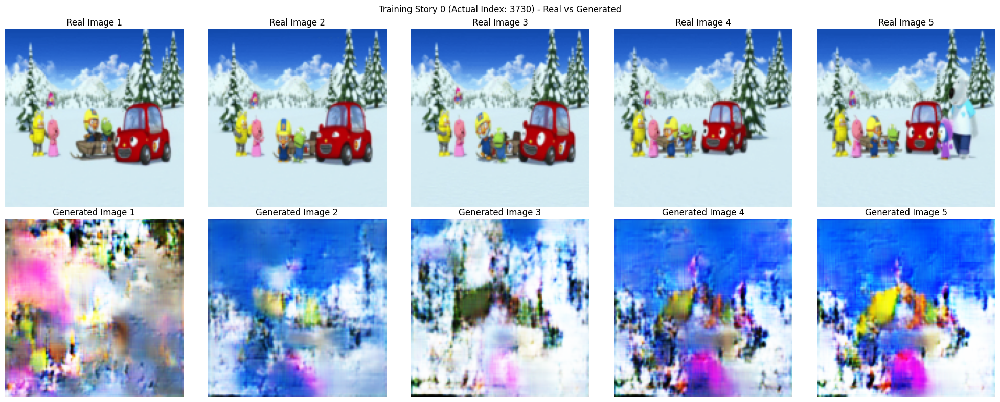


Training Story 0 (Dataset Index: 3730) Text:
Sentence 1: pororo and crong are getting out of the sled, the red car is feeling sorry for red car for losing at the race at a close call.
Sentence 2: pororo and crong are celebrating themselves for winning the race, other friends are congratulating pororo and crong.
Sentence 3: poby and petty are arriving the finishing line.
Sentence 4: poby and petty are happy that poby and petty finally made it to the finishing line, poby and petty are on the sled.
Sentence 5: poby and petty are giving congratulations to pororo and crong for winning the race.

Testing multiple stories from training data

Testing Training Story 0


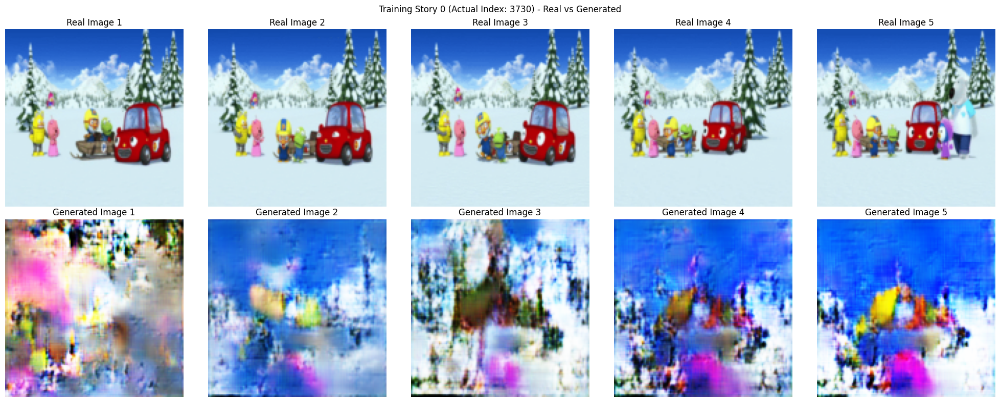


Training Story 0 (Dataset Index: 3730) Text:
Sentence 1: pororo and crong are getting out of the sled, the red car is feeling sorry for red car for losing at the race at a close call.
Sentence 2: pororo and crong are celebrating themselves for winning the race, other friends are congratulating pororo and crong.
Sentence 3: poby and petty are arriving the finishing line.
Sentence 4: poby and petty are happy that poby and petty finally made it to the finishing line, poby and petty are on the sled.
Sentence 5: poby and petty are giving congratulations to pororo and crong for winning the race.

Testing Training Story 1


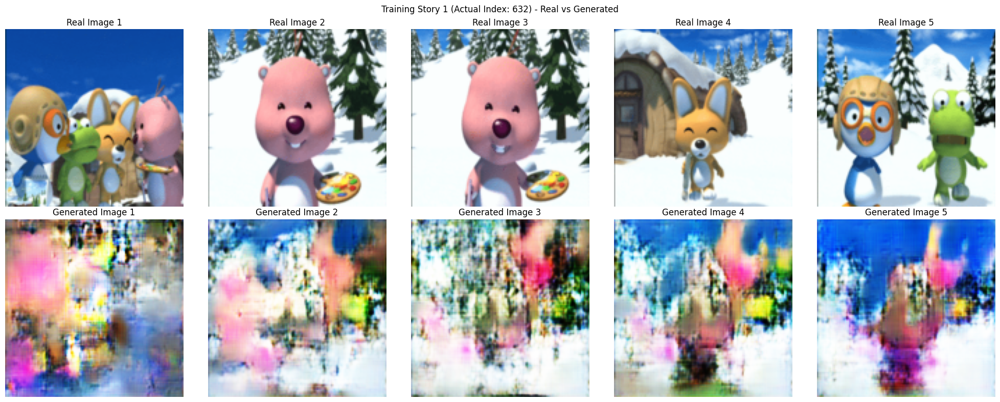


Training Story 1 (Dataset Index: 632) Text:
Sentence 1: Loopy suggests to paint pictures on the snow to Pororo Crong and Eddy, Pororo Crong and Eddy looks surprised.
Sentence 2: Pororo Crong and Eddy looks surprised and are wondering if they can paint on the snow, Loopy nods at them.
Sentence 3: Loopy says they can paint on the snow, Loopy is smiling holding a brush and paint.
Sentence 4: Eddy is holding a brush and comes forward, Eddy also wants to paint on the snow.
Sentence 5: Pororo and Crong looks at each other and comes forward to paint on the snow.

Testing Training Story 2


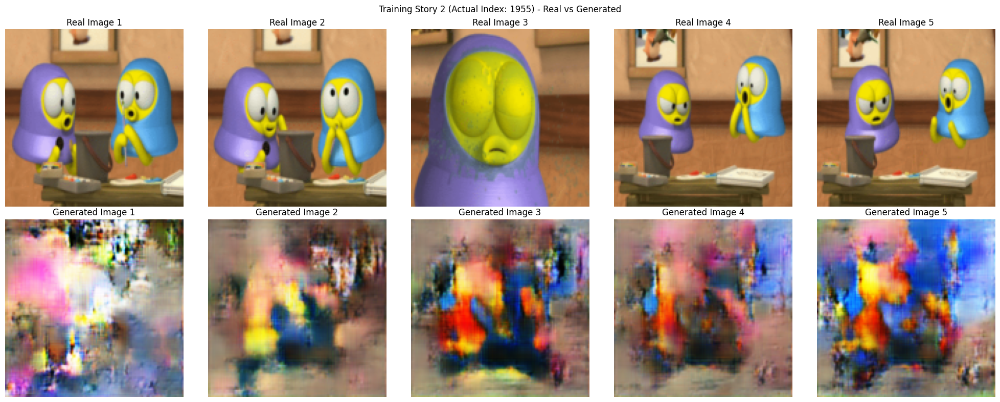


Training Story 2 (Dataset Index: 1955) Text:
Sentence 1: Popo picks up a painting brush and asks what it is.
Sentence 2: Popo eats colors and Pipi eats a chocolate cookie.
Sentence 3: Popo spits it and it spatters Pipi's head, Pipi feels angry.
Sentence 4: Popo apologizes for his mistake, Pipi tries to find something to revenge.
Sentence 5: Pipi drinks colored water, Soon Popo dashes to behind the canvas.

Comparing multiple generations with different noise


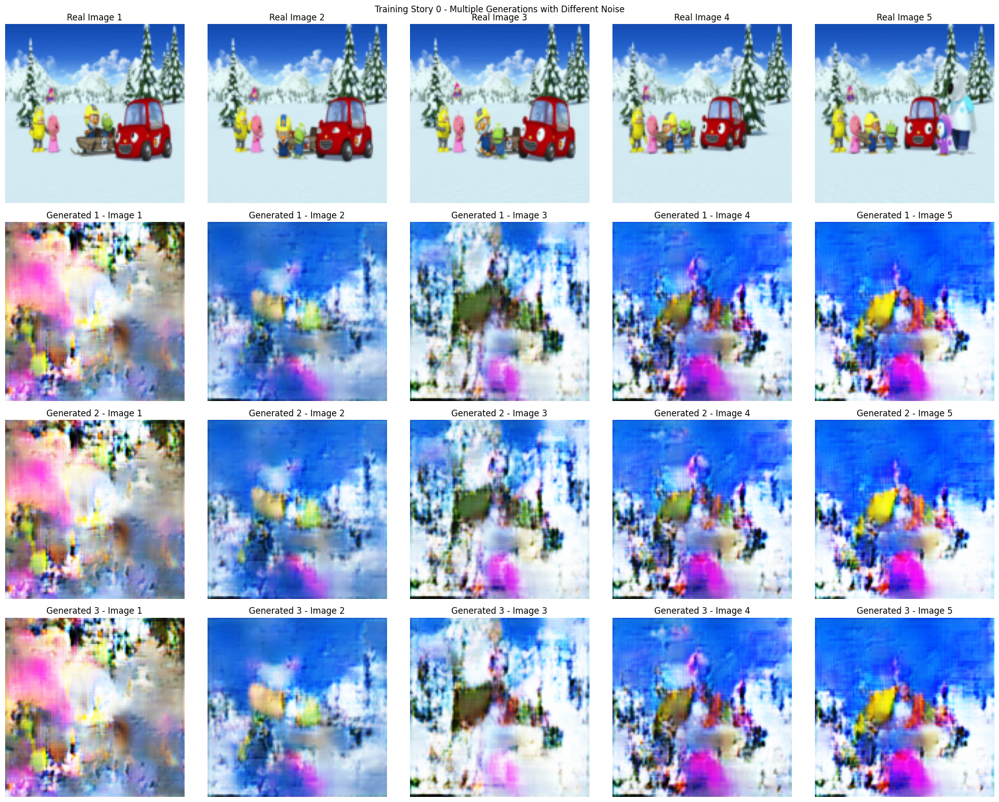


Story Text:
Sentence 1: pororo and crong are getting out of the sled, the red car is feeling sorry for red car for losing at the race at a close call.
Sentence 2: pororo and crong are celebrating themselves for winning the race, other friends are congratulating pororo and crong.
Sentence 3: poby and petty are arriving the finishing line.
Sentence 4: poby and petty are happy that poby and petty finally made it to the finishing line, poby and petty are on the sled.
Sentence 5: poby and petty are giving congratulations to pororo and crong for winning the race.
Saved: training_test_0_actual_3730_image_1.png
Saved: training_test_0_actual_3730_image_2.png
Saved: training_test_0_actual_3730_image_3.png
Saved: training_test_0_actual_3730_image_4.png
Saved: training_test_0_actual_3730_image_5.png
✅ Model testing on training data completed!
Total stories in training subset: 400
You can test any story from 0 to 399


In [104]:
# Test the trained model on training data (using the 50 stories we trained on)

import torch
import matplotlib.pyplot as plt
import numpy as np

# Set models to evaluation mode
context_encoder.eval()
text2gist_rnn.eval()
image_generator.eval()

def test_model_on_training_story(story_idx=0, show_comparison=True):
    """Test the model on a specific story from our training subset of 50 stories"""
    
    # Get the actual training data indices we used
    training_indices = indices  # This is the random subset of 50 indices we created
    actual_story_idx = training_indices[story_idx]
    
    # Get the story and embeddings from our training data
    story = stories[actual_story_idx]
    story_embeddings = story_sentence_embeddings[actual_story_idx]
    
    # Prepare input exactly like in training
    sentence_embeddings_tensor = torch.stack([torch.from_numpy(emb).float() for emb in story_embeddings])
    sentence_embeddings_sequence = sentence_embeddings_tensor.unsqueeze(0).to(device)  # Add batch dimension
    
    with torch.no_grad():
        # Encode story context
        S_enc = sentence_embeddings_sequence.view(1, -1)
        mu, logvar = context_encoder(S_enc)
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        h0 = mu + eps * std
        
        # Generate images
        noise_sequence = torch.randn(1, T, noise_dim).to(device)
        g0 = torch.zeros(1, it_dim).to(device)
        h0_rnn = torch.zeros(1, ht_dim).to(device)
        
        it_sequence, ot_sequence, _, _ = text2gist_rnn(sentence_embeddings_sequence, noise_sequence, g0, h0_rnn)
        
        generated_images = []
        for t in range(T):
            o_t = ot_sequence[:, t, :]
            fake_img = image_generator(o_t)
            generated_images.append(fake_img)
    
    # Display results
    if show_comparison:
        fig, axes = plt.subplots(2, T, figsize=(20, 8))
        
        for t in range(T):
            # Real images (top row)
            real_img = story[t]['image']
            axes[0, t].imshow(real_img)
            axes[0, t].set_title(f"Real Image {t+1}")
            axes[0, t].axis('off')
            
            # Generated images (bottom row)
            gen_img = generated_images[t].squeeze(0).cpu()
            gen_img = (gen_img + 1) / 2  # Denormalize from [-1, 1] to [0, 1]
            gen_img = torch.clamp(gen_img, 0, 1)
            gen_img = gen_img.permute(1, 2, 0)
            
            axes[1, t].imshow(gen_img)
            axes[1, t].set_title(f"Generated Image {t+1}")
            axes[1, t].axis('off')
        
        plt.suptitle(f"Training Story {story_idx} (Actual Index: {actual_story_idx}) - Real vs Generated")
        plt.tight_layout()
        plt.show()
        
        # Print story text
        print(f"\nTraining Story {story_idx} (Dataset Index: {actual_story_idx}) Text:")
        for i, element in enumerate(story):
            print(f"Sentence {i+1}: {element['text']}")
    
    return generated_images

def test_multiple_training_stories(num_stories=5):
    """Test the model on multiple stories from our training subset"""
    num_stories = min(num_stories, len(indices))  # Don't exceed our training subset size
    
    for i in range(num_stories):
        print(f"\n{'='*50}")
        print(f"Testing Training Story {i}")
        print('='*50)
        test_model_on_training_story(story_idx=i, show_comparison=True)

def compare_with_different_noise(story_idx=0, num_generations=3):
    """Generate multiple versions of the same story with different noise"""
    
    training_indices = indices
    actual_story_idx = training_indices[story_idx]
    story = stories[actual_story_idx]
    story_embeddings = story_sentence_embeddings[actual_story_idx]
    
    sentence_embeddings_tensor = torch.stack([torch.from_numpy(emb).float() for emb in story_embeddings])
    sentence_embeddings_sequence = sentence_embeddings_tensor.unsqueeze(0).to(device)
    
    context_encoder.eval()
    text2gist_rnn.eval()
    image_generator.eval()
    
    # Generate multiple versions
    all_generated_images = []
    
    with torch.no_grad():
        S_enc = sentence_embeddings_sequence.view(1, -1)
        mu, logvar = context_encoder(S_enc)
        std = torch.exp(0.5 * logvar)
        
        for gen in range(num_generations):
            eps = torch.randn_like(std)  # Different noise each time
            h0 = mu + eps * std
            
            noise_sequence = torch.randn(1, T, noise_dim).to(device)  # Different noise
            g0 = torch.zeros(1, it_dim).to(device)
            h0_rnn = torch.zeros(1, ht_dim).to(device)
            
            it_sequence, ot_sequence, _, _ = text2gist_rnn(sentence_embeddings_sequence, noise_sequence, g0, h0_rnn)
            
            generated_images = []
            for t in range(T):
                o_t = ot_sequence[:, t, :]
                fake_img = image_generator(o_t)
                generated_images.append(fake_img)
            
            all_generated_images.append(generated_images)
    
    # Display results
    fig, axes = plt.subplots(num_generations + 1, T, figsize=(20, 4*(num_generations + 1)))
    
    # Real images (first row)
    for t in range(T):
        real_img = story[t]['image']
        axes[0, t].imshow(real_img)
        axes[0, t].set_title(f"Real Image {t+1}")
        axes[0, t].axis('off')
    
    # Generated images (subsequent rows)
    for gen in range(num_generations):
        for t in range(T):
            gen_img = all_generated_images[gen][t].squeeze(0).cpu()
            gen_img = (gen_img + 1) / 2
            gen_img = torch.clamp(gen_img, 0, 1)
            gen_img = gen_img.permute(1, 2, 0)
            
            axes[gen + 1, t].imshow(gen_img)
            axes[gen + 1, t].set_title(f"Generated {gen+1} - Image {t+1}")
            axes[gen + 1, t].axis('off')
    
    plt.suptitle(f"Training Story {story_idx} - Multiple Generations with Different Noise")
    plt.tight_layout()
    plt.show()
    
    print(f"\nStory Text:")
    for i, element in enumerate(story):
        print(f"Sentence {i+1}: {element['text']}")

def save_training_story_results(story_idx=0, save_path="training_story"):
    """Save generated images from a training story"""
    generated_images = test_model_on_training_story(story_idx, show_comparison=False)
    
    training_indices = indices
    actual_story_idx = training_indices[story_idx]
    
    for t, img_tensor in enumerate(generated_images):
        img = img_tensor.squeeze(0).cpu()
        img = (img + 1) / 2  # Denormalize
        img = torch.clamp(img, 0, 1)
        img = img.permute(1, 2, 0).numpy()
        
        # Convert to PIL and save
        from PIL import Image
        img_pil = Image.fromarray((img * 255).astype(np.uint8))
        filename = f"{save_path}_{story_idx}_actual_{actual_story_idx}_image_{t+1}.png"
        img_pil.save(filename)
        print(f"Saved: {filename}")

# Test the model on our training data
print("🎨 Testing trained model on our training subset of 50 stories...")
print(f"We trained on {len(indices)} stories with indices: {indices[:10]}..." if len(indices) > 10 else f"Training indices: {indices}")

# Test on first few training stories
test_model_on_training_story(story_idx=0)

# Test on multiple training stories
print(f"\n{'='*60}")
print("Testing multiple stories from training data")
print('='*60)
test_multiple_training_stories(num_stories=3)

# Compare different generations of the same story
print(f"\n{'='*60}")
print("Comparing multiple generations with different noise")
print('='*60)
compare_with_different_noise(story_idx=0, num_generations=3)

# Save results
save_training_story_results(story_idx=0, save_path="training_test")

print("✅ Model testing on training data completed!")
print(f"Total stories in training subset: {len(indices)}")
print(f"You can test any story from 0 to {len(indices)-1}")